# Introduction

Pneumonia adalah peradangan paru-paru yang disebabkan oleh infeksi. Pneumonia bisa menimbulkan gejala yang ringan hingga berat.

[Data](https://www.news-medical.net/news/20210112/Study-shows-COVID-19-pneumonia-is-different-from-typical-pneumonia.aspx) yang telah didapatkan mengungkapkan bahwa juga terjadi peningkatan pasien yang terjangkit pneumonia semenjak pandemi COVID-19. Ditambah lagi pneumonia tidak hanya ditemukan pada orang dewasa. Melalui data yang ditemukan oleh Pusat Krisis Kesehatan Kemenkes RI menunjukkan bahwa pneumonia jauh lebih sering ditemukan pada balita. Yaitu hampir mencapai 3x lipat pada tahun 2019.

Terlebih lagi, ada kala di mana ketika setelah pasiden mendapatkan hasil scan atau x-ray, namun tidak ada dokter yang dapat membantu melakukan diagnosa.

**Anggota Tim Pengacara :**

| NPM | Nama |
| --- | --- |
| 2031016 | Jonathan|
| 2031140 | Marvin Christian|
| 2031119 | Henry|
| 2031160 | Nicky Nicholas|


# Import Data and Library

In [1]:
# Import library yang dibutuhkan
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, DenseNet201, NASNetMobile, MobileNetV3Small, MobileNetV3Large
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from time import perf_counter
from google.colab import files
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Import utils gdown untuk download dataset
import gdown
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Notebook Specifications

In [2]:
# Versi python
import sys
print(sys.version)

3.7.15 (default, Oct 12 2022, 19:14:55) 
[GCC 7.5.0]


In [3]:
# Struktur direktori
!df -h

Filesystem      Size  Used Avail Use% Mounted on
overlay         108G   41G   67G  38% /
tmpfs            64M     0   64M   0% /dev
shm             5.8G     0  5.8G   0% /dev/shm
/dev/root       2.0G  1.1G  910M  54% /sbin/docker-init
tmpfs           6.4G   44K  6.4G   1% /var/colab
/dev/sda1        55G   42G   14G  76% /etc/hosts
tmpfs           6.4G     0  6.4G   0% /proc/acpi
tmpfs           6.4G     0  6.4G   0% /proc/scsi
tmpfs           6.4G     0  6.4G   0% /sys/firmware


In [4]:
# CPU Info
!cat /proc/cpuinfo

processor	: 0
vendor_id	: AuthenticAMD
cpu family	: 23
model		: 49
model name	: AMD EPYC 7B12
stepping	: 0
microcode	: 0x1000065
cpu MHz		: 2250.000
cache size	: 512 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ht syscall nx mmxext fxsr_opt pdpe1gb rdtscp lm constant_tsc rep_good nopl nonstop_tsc cpuid extd_apicid tsc_known_freq pni pclmulqdq ssse3 fma cx16 sse4_1 sse4_2 movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm cmp_legacy cr8_legacy abm sse4a misalignsse 3dnowprefetch osvw topoext ssbd ibrs ibpb stibp vmmcall fsgsbase tsc_adjust bmi1 avx2 smep bmi2 rdseed adx smap clflushopt clwb sha_ni xsaveopt xsavec xgetbv1 clzero xsaveerptr arat npt nrip_save umip rdpid
bugs		: sysret_ss_attrs null_seg spectre_v1 spectre_v2 spec_store_bypass retbleed
bogomips	: 4500.00
TLB si

In [5]:
# Memory Info
!cat /proc/meminfo

MemTotal:       13297228 kB
MemFree:         7432348 kB
MemAvailable:   12139952 kB
Buffers:           66524 kB
Cached:          4668432 kB
SwapCached:            0 kB
Active:           786868 kB
Inactive:        4745508 kB
Active(anon):       1192 kB
Inactive(anon):   725000 kB
Active(file):     785676 kB
Inactive(file):  4020508 kB
Unevictable:           0 kB
Mlocked:               0 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:              1020 kB
Writeback:             0 kB
AnonPages:        797492 kB
Mapped:           477472 kB
Shmem:              1272 kB
KReclaimable:     227344 kB
Slab:             261772 kB
SReclaimable:     227344 kB
SUnreclaim:        34428 kB
KernelStack:        4704 kB
PageTables:        12396 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6648612 kB
Committed_AS:    3240012 kB
VmallocTotal:   34359738367 kB
VmallocUsed:        9540 kB
VmallocChunk:          0 kB
Percpu:          

In [6]:
# List of packages
import pip
!pip list

Package                       Version
----------------------------- ----------------------
absl-py                       1.3.0
aeppl                         0.0.33
aesara                        2.7.9
aiohttp                       3.8.3
aiosignal                     1.2.0
alabaster                     0.7.12
albumentations                1.2.1
altair                        4.2.0
appdirs                       1.4.4
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
async-timeout                 4.0.2
asynctest                     0.13.0
atari-py                      0.2.9
atomicwrites                  1.4.1
attrs                         22.1.0
audioread                     3.0.0
autograd                      1.5
Babel                         2.10.3
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.1
blis                          0.7.8
bokeh

## Downloading Data

Dikarenakan data dari [dataset original kaggle](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia) tidak memiliki perbandingan training, validation, dan testing yang diinginkan (80% training, 10% validation, dan 10% testing), maka tim melakukan data preparation dengan hasil sebagai berikut (melalui perpindahan image secara manual). Sehingga dataset yang didownload melalui **_gdown_** merupakan dataset yang telah dirapikan.


**Dataset Original**

|  | Normal | Pneumonia | Sum | Percentage |
| --- | --- | --- | --- | --- |
| Total Train | 1341 | 3875 | 5216 | 89% |
| Total Test | 234 | 390 | 624 | 10.7% |
| Total Validation | 8 | 8 | 16 | 0.3% |
| Total All | 1583 | 4273 | 5856 | 100% |


**Dataset After Preparation**

|  | Normal | Pneumonia | Sum | Percentage |
| --- | --- | --- | --- | --- |
| Total Train | 1266 | 3418 | 4684 | 80% (79.9863%) |
| Total Test | 158 | 427 | 585 | 10% (9.9898%) |
| Total Validation | 159 | 428 | 587 | 10% (10.0239%) |
| Total All | 1583 | 4273 | 5856 | 100% |

In [7]:
# Download dataset ke dalam notebook
!gdown 1ZQx35YM3OHZb39Ii3otS0iSpPBw6tBlQ

# Extract file hasil download 
!unzip chest_xray.zip

# Definisikan constant untuk PATH
PATH = 'chest_xray'

# Membuat direktori training : untuk data training
train_dir = os.path.join(PATH, 'train') #./chest_xray/train

# Membuat direktori validate : untuk mengukur akurasi saat training
validation_dir = os.path.join(PATH, 'val') #./chest_xray/val

# Membuat direktori testing : untuk testing pada dataset berbeda
test_dir = os.path.join(PATH, 'test') #./chest_xray/test


Downloading...
From: https://drive.google.com/uc?id=1ZQx35YM3OHZb39Ii3otS0iSpPBw6tBlQ
To: /content/chest_xray.zip
100% 1.22G/1.22G [00:04<00:00, 254MB/s]
Archive:  chest_xray.zip
replace chest_xray/test/NORMAL/NORMAL_TEST (1).jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


## Data Exploration

In [8]:
# Dapatkan total file di setiap kategori (training, validation, testing)
# Dapatkan total file training
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_train_normal = len(os.listdir(os.path.join(train_dir, "NORMAL")))
total_train_pneumonia = len(os.listdir(os.path.join(train_dir, "PNEUMONIA")))

# Dapatkan total file validation
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_val_normal = len(os.listdir(os.path.join(validation_dir, "NORMAL")))
total_val_pneumonia = len(os.listdir(os.path.join(validation_dir, "PNEUMONIA")))

# Dapatkan total file testing
total_test = sum([len(files) for r, d, files in os.walk(test_dir)])
total_test_normal = len(os.listdir(os.path.join(test_dir, "NORMAL")))
total_test_pneumonia = len(os.listdir(os.path.join(test_dir, "PNEUMONIA")))

In [9]:
# Bentuk direktori
print(train_dir)
print(validation_dir)
print(test_dir)

chest_xray/train
chest_xray/val
chest_xray/test


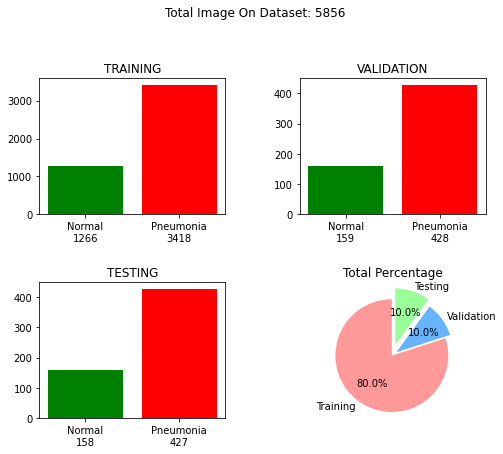

In [10]:
dataset_categories = ["Training", "Validation", "Testing"]
image_labels = ["Normal", "Pneumonia"]
total_image = [
    [total_train_normal, total_train_pneumonia],
    [total_val_normal, total_val_pneumonia],
    [total_test_normal, total_test_pneumonia]
]

bar_color = ['green','red']

plt.figure(figsize = (8, 10))
plt.suptitle("Total Image On Dataset: " + str(total_train + total_val + total_test))

for n, category in enumerate(dataset_categories):
  image_labels = ["Normal\n" + str(total_image[n][0]), "Pneumonia\n" + str(total_image[n][1])]

  ax = plt.subplot(3, 2, n + 1)

  ax.bar(image_labels, total_image[n], color=bar_color)
  
  ax.set_title(category.upper())

# Pie chart
sizes = [total_train, total_val, total_test]
colors = ['#ff9999','#66b3ff','#99ff99']

ax = plt.subplot(3, 2, 4)
ax.pie(sizes, labels=dataset_categories, autopct='%1.1f%%', colors = colors, startangle=90, explode = (0, 0.1, 0.2))
ax.axis('equal')
ax.set_title("Total Percentage")

# Show
plt.subplots_adjust(hspace=0.5, wspace=0.4)
plt.show()

# Data Preparation

## Define Variable

In [11]:
# Variables
INIT_LR = 1e-4 #0.0001
BATCH_SIZE = 128
EPOCHS = 20
IMG_HEIGHT = 224
IMG_WIDTH = 224

## Define Image Data Generator

In [12]:
train_image_generator = ImageDataGenerator(
  rescale = 1./255 # Ubah nilai tensors 0 - 255 jadi antara 0 - 1
)

val_image_generator = ImageDataGenerator(
  rescale = 1./255 # Ubah nilai tensors 0 - 255 jadi antara 0 - 1
)

test_image_generator = ImageDataGenerator(
  rescale = 1./255 # Ubah nilai tensors 0 - 255 jadi antara 0 - 1
)

## Define Data Generator

In [13]:
# Train Data Generator
train_data_gen = train_image_generator.flow_from_directory(
    batch_size = BATCH_SIZE,
    directory = train_dir,
    shuffle = True,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode = 'binary'
)

# Validation Data Generator
val_data_gen = val_image_generator.flow_from_directory(
    batch_size = BATCH_SIZE,
    directory = validation_dir,
    shuffle = True,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode = 'binary'
)

# Testing Data Generator
test_data_gen = test_image_generator.flow_from_directory(
    batch_size = 1,
    directory = test_dir,
    shuffle = False, # Bisa true jika mau (False agar mudah dibaca saat plotting)
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode = "binary"
)

Found 4684 images belonging to 2 classes.
Found 587 images belonging to 2 classes.
Found 585 images belonging to 2 classes.


In [14]:
class_labels = list(train_data_gen.class_indices.keys())
class_labels

['NORMAL', 'PNEUMONIA']

## Define Image Plotting Function

In [15]:
def plotImages(images_arr, images_label = [], probabilities = False, n_column = 1):
    images_arr_length = len(images_arr)

    figure_height = int(np.ceil(images_arr_length / n_column))
    figure_width = n_column

    fig, axes = plt.subplots (
        figure_height, 
        figure_width,
        figsize=(
            3 * n_column, # WIDTH
            images_arr_length * 3 / n_column + (0 if probabilities is False else 5) # HEIGHT
          )
       )
    
    axes = axes.flat if n_column > 1 else axes

    if probabilities is False:
      for img, lbl, ax in zip( images_arr, images_label, axes):
          ax.imshow(img)
          ax.axis('off')
          if lbl == 0:
            ax.set_title("Normal")
          else:
            ax.set_title("Pneumonia")
    else:
      for img, lbl, probability, ax in zip( images_arr, images_label, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')

          actual_label = "Normal" if lbl == 0 else "Pneumonia"

          # If peluang lebih dari 50%, maka pneumonia
          if probability > 0.5:
              ax.set_title("Pred %.2f" % (probability*100) + "% Pneumonia, \nActual " + actual_label)
          else:
              ax.set_title("Pred %.2f" % ((1 - probability)*100) + "% Normal, \nActual " + actual_label)
    
    plt.show()

### Plot Training Images

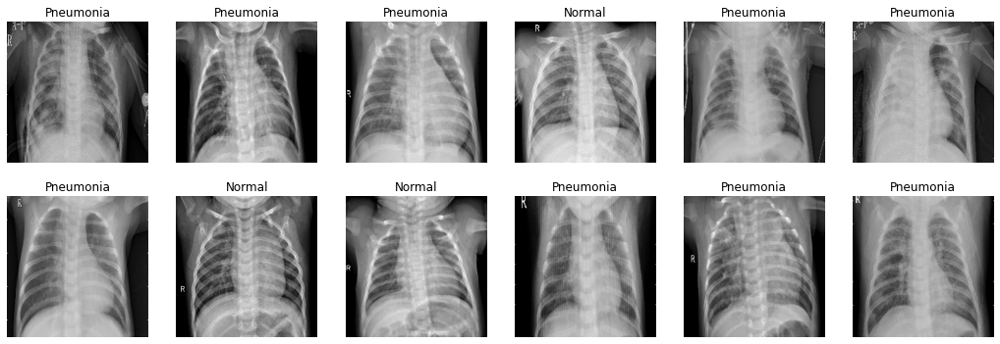

In [16]:
sample_training_images, sample_training_labels = next(train_data_gen)

total = 12
plotImages(sample_training_images[:total], images_label = sample_training_labels[:total], n_column = 6)

### Plot Validation Images

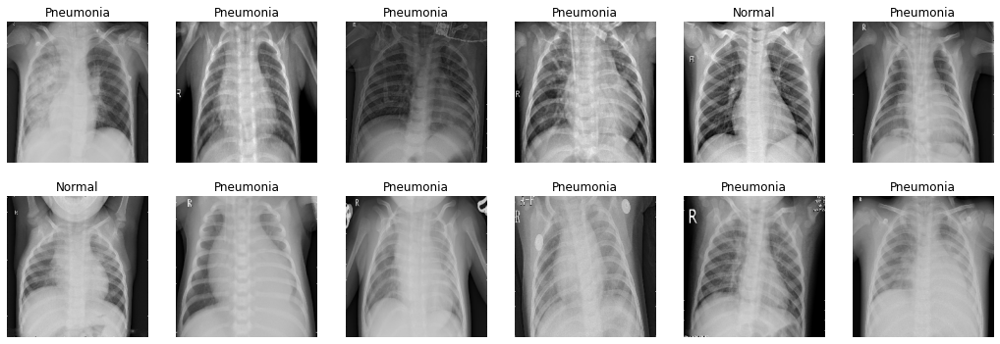

In [17]:
# Plot validation images
sample_validation_images, sample_validation_labels = next(val_data_gen)

total = 12
plotImages(sample_validation_images[:total], sample_validation_labels[:total], n_column = 6)

## Define New Augmented Image Data Generator

In [18]:
aug_train_image_generator = ImageDataGenerator(
    rescale=1./255,
   	rotation_range=20,
  	zoom_range=0.15,
  	width_shift_range=0.2,
  	height_shift_range=0.2,
  	shear_range=0.15,
  	horizontal_flip=True,
  	fill_mode="nearest",
		featurewise_center=True,
)

In [19]:
aug_train_data_gen = aug_train_image_generator.flow_from_directory(
    batch_size = BATCH_SIZE,
    directory = train_dir,
    shuffle = True,
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode = 'binary'
)

Found 4684 images belonging to 2 classes.


### Plot Augmented Training Images

/usr/local/lib/python3.7/dist-packages/keras/preprocessing/image.py:1663: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


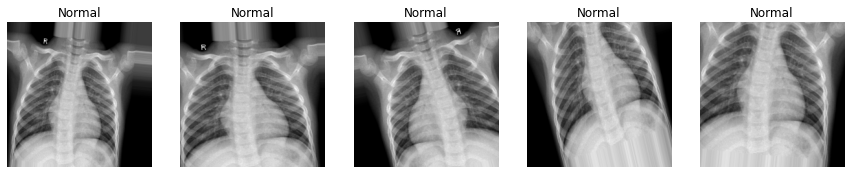

In [20]:
# Variable
image_index = 0 # Maksimal adalah 
total_image_shown = 5

# Plot
plotImages(
  [aug_train_data_gen[image_index][0][0] for i in range(total_image_shown)], 
  [aug_train_data_gen.labels[image_index] for i in range(total_image_shown)], 
  n_column = total_image_shown
)

# Model

## Model Preparation

### Define Class Weight
Karena data training yang tidak balance antara normal dan pneumonia, maka weight yang berbeda dibutuhkan agar tidak menimbulkan bias pada pneumonia yang lebih banyak.

In [21]:
weight_for_normal = total_train / (2 * total_train_normal) 
weight_for_pneumonia = total_train / (2 * total_train_pneumonia)

class_weight = { 0: weight_for_normal, 1: weight_for_pneumonia }
class_weight

{0: 1.8499210110584519, 1: 0.6851960210649503}

### Define Dictionary of Models

Melalui beberapa artikel jurnal yang telah ditemukan, mengungkapkan bahwa beberapa ***pretrained model*** yang terbaik di antara yang lain, model tersebut meliputi
1. DenseNet201
2. MobileNetV2
3. MobileNetV3Small
4. MobileNetV3Large
5. NASNetMobile

Maka dengan ini, tim juga memutuskan untuk membandingkan ke 5 model tersebut agar menemukan yang terbaik di antara mereka.

In [22]:
dict_of_models = {
    # "DenseNet201" : {"model" : DenseNet201, "performance_counter": 0 },
    # "MobileNetV2" : {"model" : MobileNetV2, "performance_counter": 0 },
    # "MobileNetV3Small" : {"model" : MobileNetV3Small, "performance_counter": 0 },
    # "MobileNetV3Large" : {"model" : MobileNetV3Large, "performance_counter": 0 },
    "NASNetMobile" : {"model" : NASNetMobile, "performance_counter": 0 }
}

### Generate Model
Untuk memudahkan adaptasi model yang bisa ditambahkan, tim membuat sebuah function yang bisa generate model berdasarkan input.

In [23]:
def generate_model(model):
  kwargs = {
    'weights' : 'imagenet', # WEIGHTS YANG TELAH DI TRAIN
    'include_top' : False, # TIDAK PAKAI INPUT
    'input_shape' : (IMG_HEIGHT, IMG_WIDTH, 3) # IMAGE_HEIGHT, IMAGE_WIDTH, INPUT_CHANNELS (RGB)
  }

  base_model = model(
      **kwargs
  )
  base_model.trainable = False

  headModel = base_model.input
  headModel = base_model.output
  headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
  headModel = Flatten(name="flatten")(headModel)
  headModel = Dense(128, activation="relu")(headModel)
  headModel = Dropout(0.5)(headModel)
  headModel = Dense(1, activation="sigmoid")(headModel)

  model = Model(inputs=base_model.input, outputs=headModel)

  # Compile model dengan optimizer Adam
  opt = Adam(learning_rate=INIT_LR, decay=INIT_LR / EPOCHS)
  model.compile(
      loss = "binary_crossentropy", 
      optimizer = opt,
      metrics = ["accuracy"]
  )

  return model

### Define Callbacks
Untuk melancarkan dan mengembangkan proses training, proses callback dibutuhkan

> A callback is an object that can perform actions at various stages of training (e.g. at the start or end of an epoch, before or after a single batch, etc). - [Tensorflow Keras Callbacks](https://keras.io/api/callbacks/)

Tim memutuskan untuk menggunakan tiga tipe metode callback:
1. **ModelCheckpoint**

Untuk menyimpan model dengan validation accuracy terbaik saat training berlangsung

2. **EarlyStopping**

Dengan 5 jenis model yang ditraining, untuk meminimalisir waktu penyelesaian dan resources, maka ini dibutuhkan untuk menghentikan proses training jika validation_loss tidak mengalami improvement (menjadi lebih rendah)

3. **ReduceLROnPlateau**

Untuk mengurangi learning rate jika tidak mendapatkan improvement pada validation accuracy.

In [24]:
# Nambah callback list ke generate model yang terpisah
def generate_callback(name):
  model_path = "output/" + name + "_train.h5"

  checkpoint = ModelCheckpoint(
      model_path, 
      monitor = 'val_accuracy', 
      verbose = 1, 
      save_best_only = True,
      mode='max'
  )

  earlystopping = EarlyStopping(
      monitor = 'val_loss',
      patience = 5,
      restore_best_weights = True
  )

  learning_rate_reduction = ReduceLROnPlateau(
      monitor='val_accuracy', 
      patience = 3, 
      verbose = 1,
      factor = 0.3, 
      min_lr = 0.000001
  )

  return [checkpoint, earlystopping, learning_rate_reduction]

## Model Prediction

In [25]:
for name, model in dict_of_models.items():
  
  # Ambil model
  tl_model = generate_model(model["model"])
  dict_of_models[name]["model"] = tl_model

  perf_counter_start = perf_counter()

  # Ambil callback
  callbacks_list = generate_callback(name)

  # Training modelnya
  print("\nStart Fitting ", str(name))

  History = tl_model.fit(
      aug_train_data_gen, 
      epochs = EPOCHS,
      steps_per_epoch = int(np.ceil(total_train / float(BATCH_SIZE))), 
      validation_data = val_data_gen,
      validation_steps = int(np.ceil(total_val / float(BATCH_SIZE))),
      callbacks = callbacks_list,
      class_weight = class_weight
  )

  # Simpan all information yang ada
  # Simpan waktu
  total_time = round(perf_counter() - perf_counter_start, 2)
  dict_of_models[name]['performance_counter'] = total_time

  # Simpan akurasi
  train_acc = History.history['accuracy']
  dict_of_models[name]['train_acc'] = train_acc

  val_acc = History.history['val_accuracy']
  dict_of_models[name]['val_acc'] = val_acc

  # Simpan loss
  train_loss = History.history['loss']
  dict_of_models[name]['train_loss'] = train_loss

  val_loss = History.history['val_loss']
  dict_of_models[name]['val_loss'] = val_loss

  print("Total Duration", str(total_time))
  print("Latest Training Accuracy", str(dict_of_models[name]['train_acc'][-1]))
  print("Latest Training Loss", str(dict_of_models[name]['train_loss'][-1]))
  print("Latest Validation Accuracy", str(dict_of_models[name]['val_acc'][-1]))
  print("Latest Validation Loss", str(dict_of_models[name]['val_loss'][-1]))


Start Fitting  NASNetMobile
Epoch 1/20
37/37 [==============================] - ETA: 0s - loss: 0.5475 - accuracy: 0.7220
Epoch 1: val_accuracy improved from -inf to 0.67462, saving model to output/NASNetMobile_train.h5
37/37 [==============================] - 338s 9s/step - loss: 0.5475 - accuracy: 0.7220 - val_loss: 0.5905 - val_accuracy: 0.6746 - lr: 1.0000e-04
Epoch 2/20
37/37 [==============================] - ETA: 0s - loss: 0.3957 - accuracy: 0.8271
Epoch 2: val_accuracy did not improve from 0.67462
37/37 [==============================] - 321s 9s/step - loss: 0.3957 - accuracy: 0.8271 - val_loss: 0.6240 - val_accuracy: 0.6508 - lr: 1.0000e-04
Epoch 3/20
37/37 [==============================] - ETA: 0s - loss: 0.3414 - accuracy: 0.8433
Epoch 3: val_accuracy improved from 0.67462 to 0.71721, saving model to output/NASNetMobile_train.h5
37/37 [==============================] - 328s 9s/step - loss: 0.3414 - accuracy: 0.8433 - val_loss: 0.5335 - val_accuracy: 0.7172 - lr: 1.0000e-0

### Plotting Training Result

#### Define Plotting Function

In [26]:
def plot_accuracy_history(models):
  fig, axes = plt.subplots (
      len(dict_of_models), #ROW
      1, #COLUMN
      figsize=(
          7, # WIDTH
          5 * len(dict_of_models) #HEIGHT
        )
      )
  
  axes = axes.flat if len(dict_of_models) > 1 else [axes]

  for ax, name in zip(axes, dict_of_models.keys()):
    acc = dict_of_models[name]['train_acc']
    val_acc = dict_of_models[name]['val_acc']

    epochs_range = range(len(acc))

    ax.plot(epochs_range, acc, label='Training Accuracy')
    ax.plot(epochs_range, val_acc, label='Validation Accuracy')
    ax.legend(loc='lower right')
    ax.set_title(name + ' Training and Validation Accuracy')

  plt.suptitle("Training and Validation Accuracy", fontsize=20)
  fig.tight_layout()
  fig.subplots_adjust(top= 0.025 * len(dict_of_models) + 0.825)
  plt.show()

In [27]:
def plot_loss_history(models):
  fig, axes = plt.subplots (
      len(dict_of_models), #ROW
      1, #COLUMN
      figsize=(
          7, # WIDTH
          5 * len(dict_of_models) #HEIGHT
        )
      )

  axes = axes.flat if len(dict_of_models) > 1 else [axes]

  for ax, name in zip(axes, dict_of_models.keys()):
    loss = dict_of_models[name]['train_loss']
    val_loss = dict_of_models[name]['val_loss']

    epochs_range = range(len(loss))

    ax.plot(epochs_range, loss, label='Training Loss')
    ax.plot(epochs_range, val_loss, label='Validation Loss')
    ax.legend(loc='upper right')
    ax.set_title(name + ' Training and Validation Loss')

  plt.suptitle("Training and Validation Loss", fontsize=20)
  fig.tight_layout()
  fig.subplots_adjust(top= 0.025 * len(dict_of_models) + 0.825)
  plt.show()

#### Plot Results

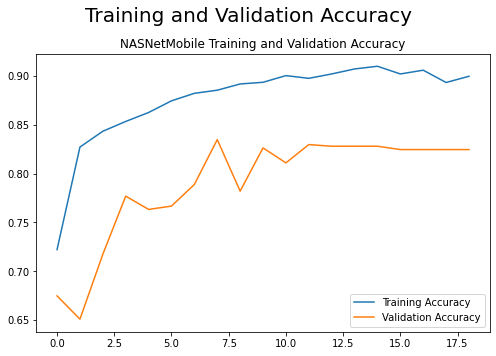

In [28]:
plot_accuracy_history(dict_of_models)

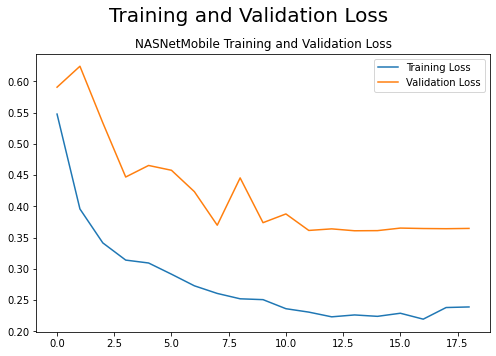

In [29]:
plot_loss_history(dict_of_models)

# Output

## Predict Test Set

In [30]:
for name, model in dict_of_models.items():
  # Probabilities
  probabilities = model["model"].predict(test_data_gen)
  dict_of_models[name]['probabilities'] = probabilities
  
  # Predicted Labels
  predicted_labels = np.where(probabilities > 0.5, 1, 0)
  dict_of_models[name]['predicted_labels'] = predicted_labels.ravel()

  # Classification report dari hasil prediksi
  pred_classification_report = (classification_report(test_data_gen.labels, predicted_labels, target_names=test_data_gen.class_indices.keys()))
  dict_of_models[name]['pred_classification_report'] = pred_classification_report

  # Confusion Matrix dari hasil prediksi
  cm = confusion_matrix(test_data_gen.labels, predicted_labels>0.5)
  dict_of_models[name]['confusion_matrix'] = cm

585/585 [==============================] - 53s 84ms/step


### Confusion Matrix

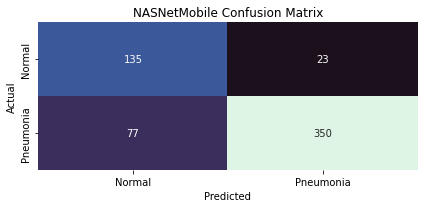

In [31]:
fig, axes = plt.subplots(
    len(dict_of_models), # ROW
    1, # COLUMN
    figsize = (6, 3 * len(dict_of_models))
    )

axes = axes.flat if len(dict_of_models) > 1 else [axes]

for ax, name in zip(axes, dict_of_models.keys()):
  cm = dict_of_models[name]['confusion_matrix']

  sns.heatmap(cm, ax = ax, annot=True, fmt='g', vmin=0, cmap='mako', cbar=False)
  ax.set_xlabel("Predicted")
  ax.set_ylabel("Actual")
  ax.set_xticklabels(['Normal', 'Pneumonia'])
  ax.set_yticklabels(['Normal', 'Pneumonia'])
  ax.set_title(name + " Confusion Matrix")

fig.set_tight_layout(True)
plt.show()

### Classification Report

In [32]:
for name in dict_of_models.keys():
  print(name, "Classification Report")
  print(dict_of_models[name]["pred_classification_report"] + "\n")

NASNetMobile Classification Report
              precision    recall  f1-score   support

      NORMAL       0.64      0.85      0.73       158
   PNEUMONIA       0.94      0.82      0.88       427

    accuracy                           0.83       585
   macro avg       0.79      0.84      0.80       585
weighted avg       0.86      0.83      0.84       585




### Plotting Test Set Result

In [33]:
show_total_test_images = total_test  

#### DenseNet201 Prediction

In [34]:
if "DenseNet201" in dict_of_models:
  densenet201_probabilities = dict_of_models["DenseNet201"]["probabilities"]

  plotImages([test_data_gen[i][0][0] for i in range(show_total_test_images)], images_label = test_data_gen.labels, probabilities=densenet201_probabilities, n_column = 5)
else:
  print("This notebook doesn't train DenseNet201")

This notebook doesn't train DenseNet201


#### MobileNetV2 Prediction

In [35]:
if "MobileNetV2" in dict_of_models:
  mobiletnetv2_probabilities = dict_of_models["MobileNetV2"]["probabilities"]

  plotImages([test_data_gen[i][0][0] for i in range(show_total_test_images)], images_label = test_data_gen.labels, probabilities=mobiletnetv2_probabilities, n_column = 5)
else:
  print("This notebook doesn't train MobileNetV2")

This notebook doesn't train MobileNetV2


#### MobileNetV3Small Prediction

In [36]:
if "MobileNetV3Small" in dict_of_models:
  mobiletnetv3small_probabilities = dict_of_models["MobileNetV3Small"]["probabilities"]

  plotImages([test_data_gen[i][0][0] for i in range(show_total_test_images)], images_label = test_data_gen.labels, probabilities=mobiletnetv3small_probabilities, n_column = 5)
else:
  print("This notebook doesn't train MobileNetV3Small")

This notebook doesn't train MobileNetV3Small


#### MobileNetV3Large Prediction

In [37]:
if "MobileNetV3Large" in dict_of_models:
  mobiletnetv3large_probabilities = dict_of_models["MobileNetV3Large"]["probabilities"]

  plotImages([test_data_gen[i][0][0] for i in range(show_total_test_images)], images_label = test_data_gen.labels, probabilities=mobiletnetv3large_probabilities, n_column = 5)
else:
  print("This notebook doesn't train MobileNetV3Large")

This notebook doesn't train MobileNetV3Large


#### NASNetMobile Prediction

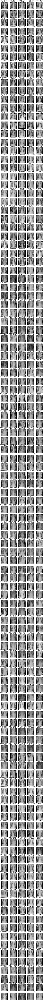

In [38]:
if "NASNetMobile" in dict_of_models:
  nasnetmobile_probabilities = dict_of_models["NASNetMobile"]["probabilities"]

  plotImages([test_data_gen[i][0][0] for i in range(show_total_test_images)], images_label = test_data_gen.labels, probabilities=nasnetmobile_probabilities, n_column = 5)
else:
  print("This notebook doesn't train NASNetMobile")

## Serialization / Save Final Model

In [39]:
# Serialisasi / Simpan model dalam bentuk file
for name, model in dict_of_models.items():
  model["model"].save("output/" + name + "_pneumonia.model", save_format="h5")

In [41]:
!zip -r /content/output.zip /content/output

  adding: content/output/ (stored 0%)
  adding: content/output/NASNetMobile_pneumonia.model (deflated 16%)
  adding: content/output/NASNetMobile_train.h5 (deflated 16%)


In [42]:
files.download("/content/output.zip") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>